# Galaxies: An interactive graduate course

## Chapter 2.3: Surface brightness, size, and total flux

#### (c) Benedikt Diemer, University of Maryland (based on similar notebooks by Andrey Kravtsov, University of Chicago)

In [1]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
from routines import common as cmn

# Plotting settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Automatically reload code imported from changed python files
%reload_ext autoreload
%autoreload 2

### 2.3.2) Surface brightness profiles

In [2]:
from routines import obs_sdss

data = obs_sdss.loadSdssSpecSampleExtra()

print('Found %d galaxies with the following fields:' % (len(data)))
for k in data.dtype.names:
    print(k)

Found 672813 galaxies with the following fields:
ra
dec
mjd
plate
fiberID
class
z
zErr
rChi2
velDisp
velDispErr
extinction_u
extinction_g
extinction_r
extinction_i
extinction_z
fiberMag_u
fiberMag_g
fiberMag_r
fiberMag_i
fiberMag_z
modelMag_u
modelMag_g
modelMag_r
modelMag_i
modelMag_z
cmodelMag_u
cmodelMag_g
cmodelMag_r
cmodelMag_i
cmodelMag_z
phioffset_r
fracdeV_r
deVRad_r
deVRadErr_r
deVAB_r
deVABErr_r
deVPhi_r
lnLDeV_r
deVMag_r
deVMagErr_r
expRad_r
expRadErr_r
expAB_r
expABErr_r
expPhi_r
lnLExp_r
expMag_r
expMagErr_r
petroMag_u
petroMag_g
petroMag_r
petroMag_i
petroMag_z
petroRad_u
petroRad_g
petroRad_r
petroRad_i
petroRad_z
petroR50_r
petroR90_r
petroR50Err_r
petroR90Err_r
h_alpha_flux
h_alpha_flux_err
oiii_5007_flux
oiii_5007_flux_err
d4000
d4000_err
bptclass
lgm_tot_p50
sfr_tot_p50
objID
specObjID
K_u
K_g
K_r
K_i
K_z
color_ug
color_gr
color_ri
color_iz
DM
dL
dA
M_model_u
m_model_u
M_cmodel_u
m_cmodel_u
M_petro_u
m_petro_u
M_fiber_u
m_fiber_u
M_model_g
m_model_g
M_cmodel_g
m_cmod

#### Sersic profiles

Let's make a comparison plot of the Sersic family of profiles, which includes the exponential and de Vaucouleurs profiles.

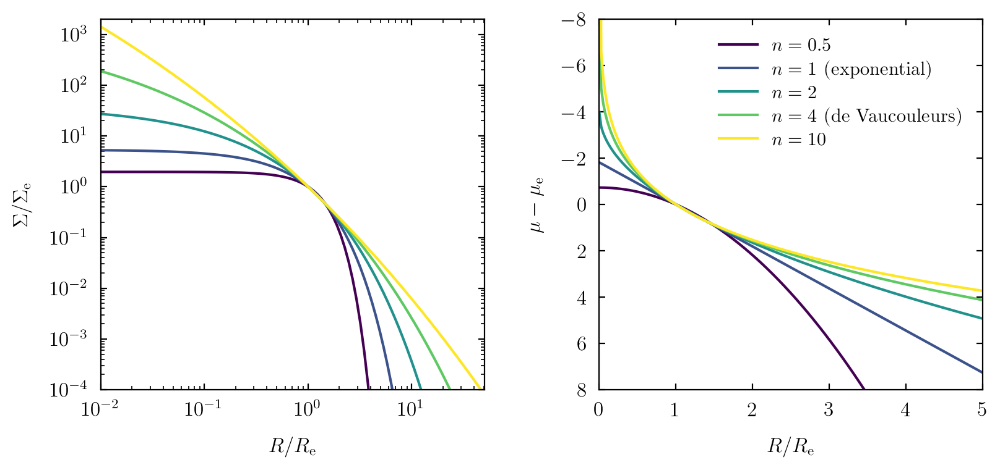

In [3]:
sersic_n = [0.5, 1, 2, 4, 10]

x_min_lin = 0.0
x_max_lin = 5.0
x_min_log = -2.0
x_max_log = 1.7

r_re_lin = np.linspace(x_min_lin, x_max_lin, 200)
r_re_log = 10**np.linspace(x_min_log, x_max_log, 100)
cmap = plt.get_cmap('viridis')

fig, axes = plt.subplots(1, 2, figsize = (9.5, 4.0))
plt.subplots_adjust(wspace = 0.3)

plt.sca(axes[0])
plt.loglog()
plt.xlabel(r'$R/R_{\rm e}$')
plt.ylabel(r'$\Sigma/\Sigma_{\rm e}$')
plt.xlim(10**x_min_log, 10**x_max_log)
plt.ylim(1E-4, 2E3)

plt.sca(axes[1])
plt.xlabel(r'$R/R_{\rm e}$')
plt.ylabel(r'$\mu - \mu_{\rm e}$')
plt.xlim(x_min_lin, x_max_lin)
plt.ylim(8.0, -8.0)

for i in range(len(sersic_n)):
    n = sersic_n[i]
    bn = 1.9992 * n - 0.3271
    sigma = np.exp(-bn * (r_re_log**(1.0 / n) - 1.0))
    mu = 1.086 * bn * (r_re_lin**(1.0 / n) - 1.0)
    
    label = r'$n=%s$' % (str(n))
    if n == 1:
        label += r'$\ \mathrm{(exponential)}$'
    elif n == 4:
        label += r'$\ \mathrm{(de\ Vaucouleurs)}$'
    color = cmap(i / (len(sersic_n) - 1))
    
    plt.sca(axes[0])
    plt.plot(r_re_log, sigma, '-', color = color, label = label)
    plt.sca(axes[1])
    plt.plot(r_re_lin, mu, '-', color = color, label = label)

plt.sca(axes[1])
lg = plt.legend(loc = 1, labelspacing = 0.3)
plt.setp(lg.get_texts(), fontsize = 11)
plt.show()

#### Profiles from SDSS pipeline

Our SDSS dataset contains the results of both exponential and de Vaucouleurs fits. In general, we want to use the $R_{\rm e}$ from the better fit. We can find out which one that is by by comparing the ``model`` magnitude to the ``exp`` and ``deV`` magnitudes; it should be exactly one of those two. 

The best-fit radii are given in arcseconds. We convert to pixels using the arcsec / pixel in our images. The "natural" scale of the SDSS images, which is $1'' = 1 / 0.39612 = 2.52$ pixels (stored in ``obs_sdss.sdss_pixel_scale``). We'll use that for the following image plots. The fits are done in ellipsoidal annuli, so we need to compute the major and minor axes from the $R_{\rm e}$ values (the major axes) and the $b/a$ ratios:

In [4]:
# Figure out which galaxies are better fit by exp and which by deV
diff_exp = np.abs(data['modelMag_r'] - data['expMag_r'])
diff_dev = np.abs(data['modelMag_r'] - data['deVMag_r'])
mask_exp = (diff_exp < diff_dev)
re_best = np.array(data['deVRad_r'])
re_best[mask_exp] = data['expRad_r'][mask_exp]

# Compute major and minor axes in pixels
exp_major = data['expRad_r'] / obs_sdss.sdss_pixel_scale * 2.0
exp_minor = exp_major * data['expAB_r']
exp_phi = data['expPhi_r']

dev_major = data['deVRad_r'] / obs_sdss.sdss_pixel_scale * 2.0
dev_minor = dev_major * data['deVAB_r']
dev_phi = data['deVPhi_r']

Let's plot the exponential and de Vaucouleurs fits to some random galaxies.

In [5]:
import matplotlib as mpl

def plotImagesAndRe(d, n_rows = 3, n_cols = 4, n_pix = 200, panel_size = 3.0, radii = 'expdev', save = False, fn = 're.pdf'):

    fig, axs = obs_sdss.imageCollage(d, n_rows, n_cols, n_pix = n_pix, panel_size = panel_size, show = False)

    axs = axs.flatten()
    center_pos = (n_pix * 0.5, n_pix * 0.5)
    for i in range(len(idxs)):
        ax = axs[i]
        ix = idxs[i]
        plt.sca(ax)
        
        if radii == 'expdev':
            if mask_exp[ix]:
                ls_exp = '-'
                ls_dev = '--'
            else:
                ls_exp = '--'
                ls_dev = '-'
            ellipse = mpl.patches.Ellipse(center_pos, exp_minor[ix], exp_major[ix], angle = -exp_phi[ix], 
                                          color = 'w', fill = False, linestyle = ls_exp, linewidth = 0.5)
            ax.add_artist(ellipse)
            ellipse = mpl.patches.Ellipse(center_pos, dev_minor[ix], dev_major[ix], angle = -dev_phi[ix], 
                                          color = 'yellow', fill = False, linestyle = ls_dev, linewidth = 0.5)
            ax.add_artist(ellipse)
        
        elif radii == 'petro_50_90':
            # Note that Circle takes a radius while Ellipse takes a diameter
            circle = mpl.patches.Circle(center_pos, d[i]['petroR50_r'], color = 'w', fill = False, 
                                        linewidth = 0.5)
            ax.add_artist(circle)
            circle = mpl.patches.Circle(center_pos, d[i]['petroR90_r'], color = 'yellow', fill = False, 
                                        linewidth = 0.5)
            ax.add_artist(circle)

        else:
            raise Exception('Unknown radii, %s.' % (radii))

    if save:
        plt.savefig(fn)
    else:
        plt.show()

    return

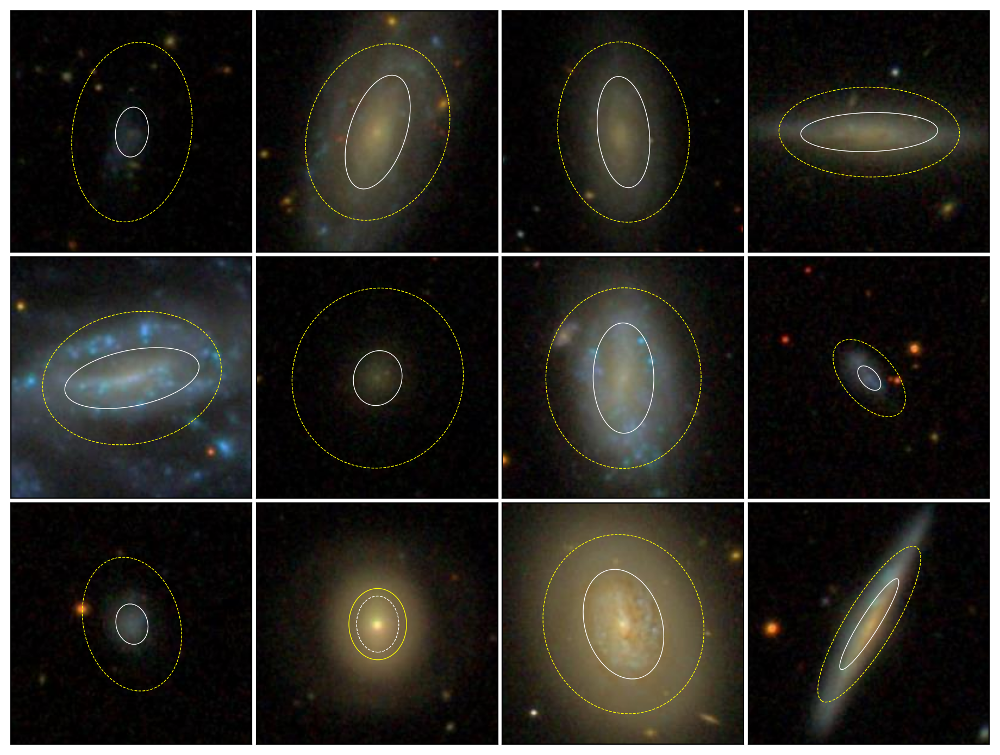

In [6]:
n_rows = 3
n_cols = 4

np.random.seed(2026)
idxs_near = np.where((data['dL'] >= 20.0) & (data['dL'] <= 50.0))[0]
idxs = idxs_near[np.random.randint(0, len(idxs_near) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_rows = n_rows, n_cols = n_cols, save = False, fn = 'sdss_re1.pdf')

For almost all of the galaxies above, the exponential profile is the better fit. Let's plot some galaxies where the de Vaucouleurs profile is the better fit:

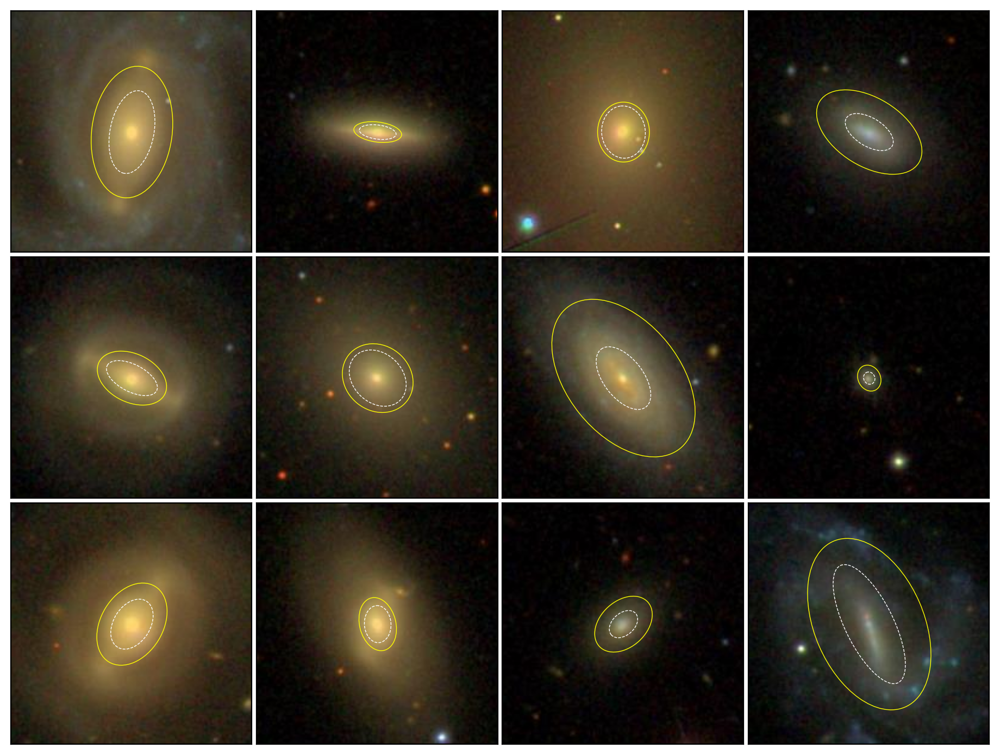

In [7]:
np.random.seed(2024)
idxs_dev_fit = idxs_near[np.logical_not(mask_exp[idxs_near])]
idxs = idxs_dev_fit[np.random.randint(0, len(idxs_dev_fit) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_rows = n_rows, n_cols = n_cols, save = False, fn = 'sdss_re2.pdf')

Visually, these galaxies look more extended and redder, confirming that ellipticals tend to be better fit by the de Vaucouleurs profile. Some of the de Vaucouleurs effective radii seem rather large, way beyond where one would put the half-light radius by eye. This can partially be explained by the definition (see lecture notes).

We note that the vast majority of de Vaucouleurs fits seem to lead to larger radii than exponential fits. Let's look at some galaxies where this is reversed:

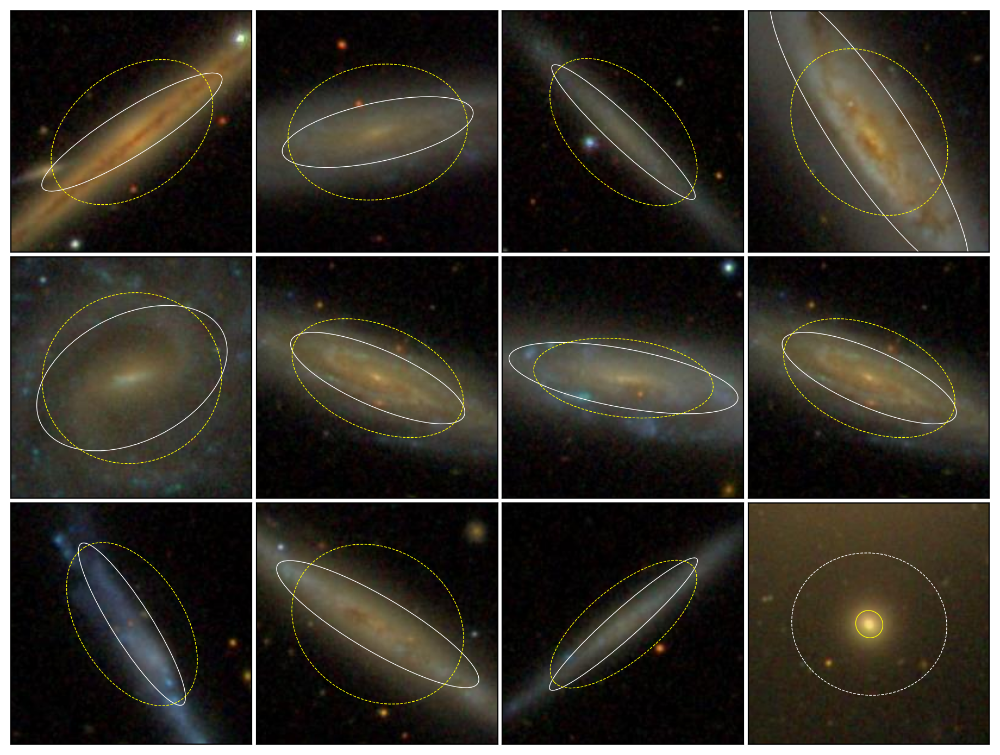

In [8]:
np.random.seed(2023)
idxs_dev_larger = idxs_near[exp_major[idxs_near] > dev_major[idxs_near]]
idxs = idxs_dev_larger[np.random.randint(0, len(idxs_dev_larger) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_rows = n_rows, n_cols = n_cols)

Some of these look like pretty strange objects with questionable fits or very elongated shapes. Almost all of them are very nearby (large on the sky). Speaking of which, we have been looking only at fairly nearby objects. What happens with less resolved, farther away galaxies?

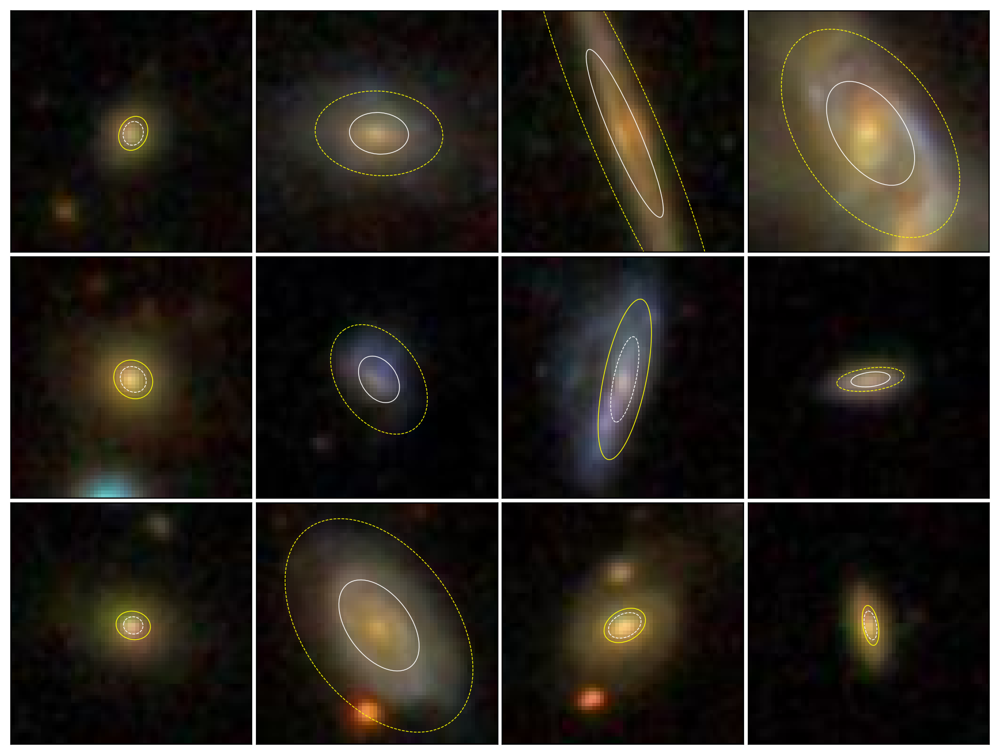

In [9]:
np.random.seed(2023)
idxs_far = np.where((data['dL'] >= 200.0) & (data['dL'] <= 300.0))[0]
idxs = idxs_far[np.random.randint(0, len(idxs_far) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_pix = 64, n_rows = n_rows, n_cols = n_cols)

In quite a few objects, the best-fit radii corresponds to only a few pixels.

#### Fitting the profiles

The SDSS database contains not only the results that we have derived from surface brightness profiles (such as exponential fits), but also the profiles themselves. We can download this table with the following SQL command:

This command extracts profiles for the same galaxies as in our spectroscopic SDSS sample, but with the additional constraint that ``m_petro_r < 16`` (since the file otherwise gets too slow to load). Let's plot the radial profiles for a few random galaxies in all filter bands.

In [10]:
# The documentation of the bin table is as follows:
#
# bin    int    4           EXTENSION       bin
# cell   int    4           EXTENSION       the first cell in the annulus
# sinc   int    4           CODE_MISC       sinc shift (0:no, 1:yes)
# rInner float  8 arcsec    EXTENSION_RAD   Inner radius of the bin
# rOuter float  8 arcsec    EXTENSION_RAD   Outer radius of the bin
# aAnn   float  8 arcsec^2  EXTENSION_AREA  The area of the annulus
# aDisk  float  8 arcsec^2  EXTENSION_AREA  The area of the disk to outerRadius
prf_ids, prfs, prf_err = obs_sdss.loadSDSSProfiles()
bin_data = np.loadtxt(cmn.data_dir + 'sdss/sdss_profilebins_dr8.txt', unpack = True, skiprows = 1, delimiter = ',')
bin_lo = bin_data[3]
bin_hi = bin_data[4]
bin_centers = (bin_lo + bin_hi) * 0.5

for i in range(len(bin_centers)):
    print('Bin %2d from %6.2f to %6.2f, center %6.2f' % (i, bin_lo[i], bin_hi[i], bin_centers[i]))

Removing 284/57593 galaxies from the profiles set.
Bin  0 from   0.00 to   0.22, center   0.11
Bin  1 from   0.22 to   0.67, center   0.45
Bin  2 from   0.67 to   1.03, center   0.85
Bin  3 from   1.03 to   1.75, center   1.39
Bin  4 from   1.75 to   2.97, center   2.36
Bin  5 from   2.97 to   4.59, center   3.78
Bin  6 from   4.59 to   7.36, center   5.97
Bin  7 from   7.36 to  11.31, center   9.33
Bin  8 from  11.31 to  18.02, center  14.66
Bin  9 from  18.02 to  27.92, center  22.97
Bin 10 from  27.92 to  43.77, center  35.84
Bin 11 from  43.77 to  68.30, center  56.04
Bin 12 from  68.30 to 106.72, center  87.51
Bin 13 from 106.72 to 166.51, center 136.62
Bin 14 from 166.51 to 258.38, center 212.45


Image size is 118.8 arcsec


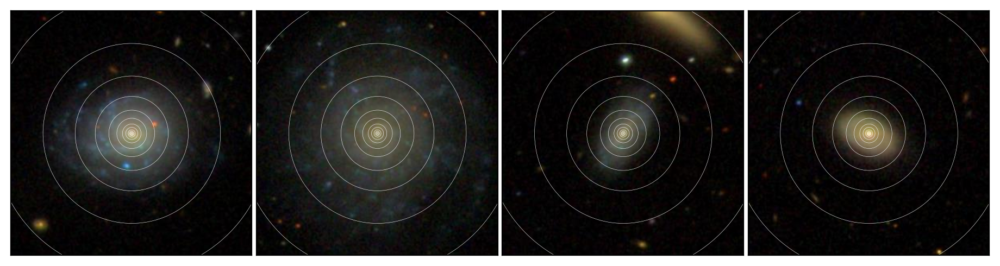

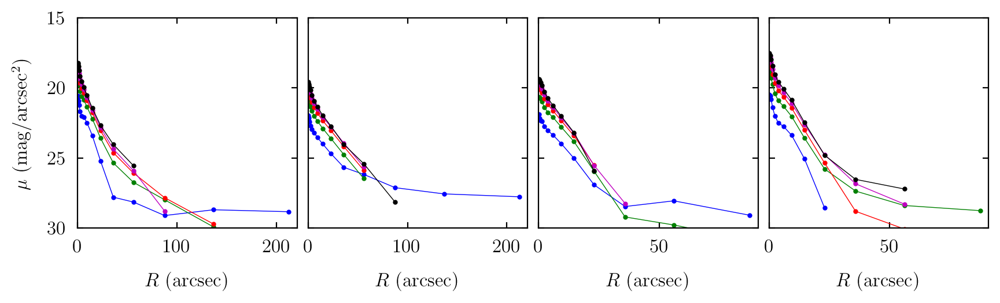

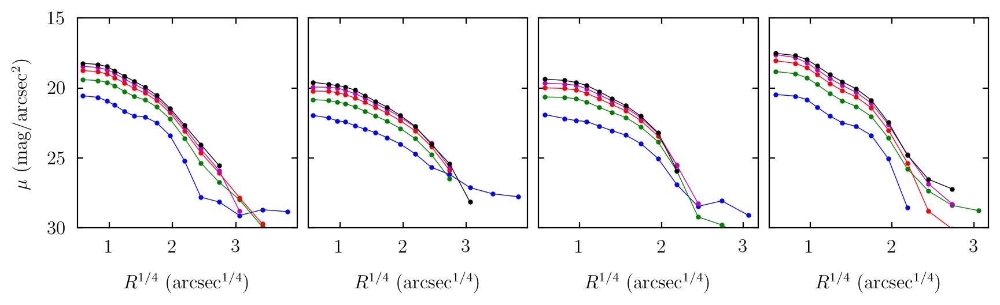

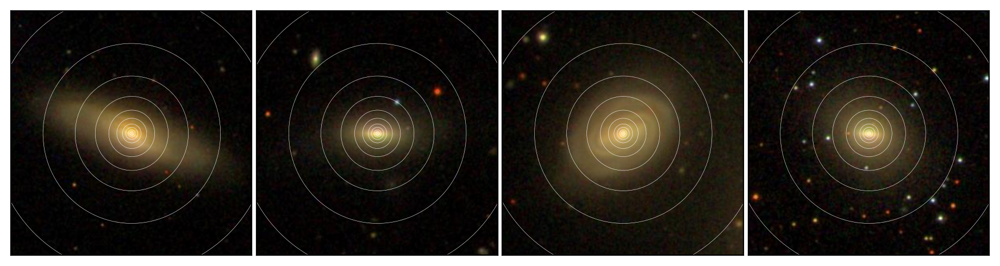

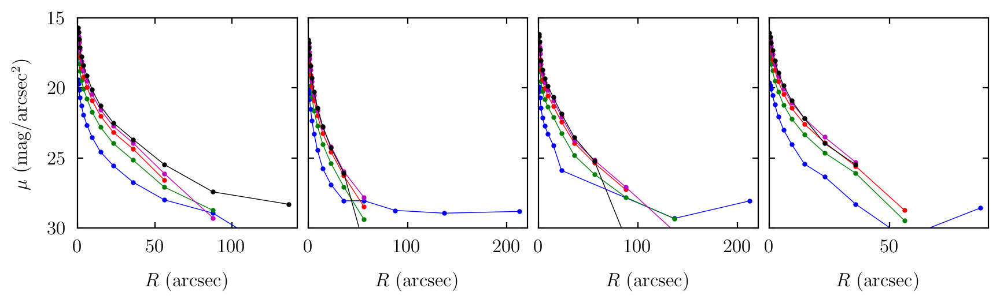

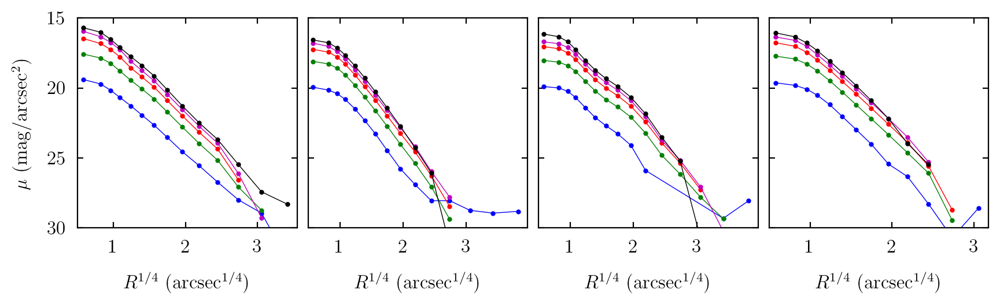

In [11]:
# Convert units; profiles are given in nanomaggies/arcsec^2, where a "maggy" is the source flux
# relative to the zero point. A magnitude is then 
#
# mu(mags) = -2.5 * log10(1E-9) - 2.5 log10(F) = 22.5 - 2.5 log10(F)

import matplotlib as mpl

n_rows = 1
n_cols = 4
n_pix = 300
save = False
print('Image size is %.1f arcsec' % (n_pix * obs_sdss.sdss_pixel_scale))

# Select galaxies that have profiles, that are pretty close and luminous, and that 
# don't have very small axis ratios
np.random.seed(2025)
mask = np.in1d(data['objID'], prf_ids)
mask &= (data['dL'] >= 20.0) & (data['dL'] <= 60.0) & (data['M_cmodel_r'] < -19.0)
mask &= (data['ab_best'] > 0.4)

idxs_gals = []
idxs_prfs = []
prfs_r = []
prfs_err = []

# Plot twice for disky galaxies and elliptical-ish galaxies
for k in range(2):

    # Select valid galaxies and record their indices in the data array for later
    if k == 0:
        mask_use = mask & data['mask_exp']
    else:
        mask_use = mask & np.logical_not(data['mask_exp'])
    idxs_all = np.where(mask_use)[0]
    if len(idxs_all) == 0:
        raise Exception('Found zero objects that match the mask.')
    idxs = idxs_all[np.random.randint(0, len(idxs_all) - 1, n_rows * n_cols)]
    idxs_gals.append(idxs)

    # Find the photometric object in profiles by matching IDs
    idxs_prfs.append([])
    prfs_r.append([])
    prfs_err.append([])
    for i in range(n_cols):
        idx_gal = idxs_gals[k][i]
        idx_prf = np.where(prf_ids == data['objID'][idx_gal])[0]
        if len(idx_prf) != 1:
            raise Exception('Expected to find exactly one profile for object ID, found %d.' % len(idx_prf))
        idx_prf = idx_prf[0]
        idxs_prfs[k].append(idx_prf)
        if (prf_ids[idxs_prfs[k][i]] != data['objID'][idxs_gals[k][i]]):
            raise Exception('IDs do not match.')

    # Plot images with annuli overlaid
    fig, axs = obs_sdss.imageCollage(data[idxs], n_rows, n_cols, n_pix = n_pix, panel_size = 3.0, show = False)
    axs = axs.flatten()
    center_pos = (n_pix * 0.5, n_pix * 0.5)
    for i in range(len(idxs)):
        ax = axs[i]
        plt.sca(ax)
        for j in range(len(bin_hi)):
            bin_pix = bin_hi[j] / obs_sdss.sdss_pixel_scale
            circle = mpl.patches.Circle(center_pos, bin_pix, color = 'w', fill = False, linewidth = 0.2)
            ax.add_artist(circle)
    if save:
        plt.savefig('sdss_profiles_images_%d.pdf' % k)
    else:
        plt.show()
    
    # Plot profiles twice, once with a linear and once with R^1/4 axes
    for l in range(2):
        fig, axs = plt.subplots(1, n_cols, figsize = (0.5 + n_cols * 2.5, 2.8))
        plt.subplots_adjust(wspace = 0.05, bottom = 0.3)
        for i in range(n_cols):
            plt.sca(axs[i])
            if l == 0:
                plt.xlabel(r'$R\ ({\rm arcsec})$')
            else:
                plt.xlabel(r'$R^{1/4}\ ({\rm arcsec}^{1/4})$')
            if i == 0:
                plt.ylabel(r'$\mu\ ({\rm mag} / {\rm arcsec}^2)$', labelpad = 10)
            else:
                axs[i].set_yticklabels([])

            # Plot profiles in all 5 bands
            idx_prf = idxs_prfs[k][i]
            max_R = 0.0
            for j in range(5):
                mask_bins = (prfs[idx_prf, j, :] >= 0.0)
                if l== 0:
                    x = bin_centers[mask_bins]
                else:
                    x = bin_centers[mask_bins]**0.25
                mu = 22.5 - 2.5 * np.log10(prfs[idx_prf, j, mask_bins])
                
                # Save r-band data for later; the list object has dimensions [2, 4, 2, N] for
                # spiral/elliptical, 4 galaxies, r/mu, N_bins
                if j == 2:
                    prfs_r[k].append([bin_centers[mask_bins], mu])
                
                plt.plot(x, mu, marker = 'o', ms = 2.0, lw = 0.5, c = obs_sdss.filter_colors[j])
                max_R = max(max_R, x[-1])
            if l == 0:
                plt.xlim(0.0, max_R * 1.04)
            else:
                plt.xlim(0.5, max_R * 1.04)
            plt.ylim(15.0, 30.0)
            axs[i].invert_yaxis()
        if save:
            plt.savefig('sdss_profiles_prf_%d_%d.pdf' % (k, l))
        else:
            plt.show()

We see that indeed the galaxies that are better fit by an exponential have roughly linear profiles in $R$-$\mu$ space, whereas the ones fit better by de Vaucouleurs have roughly linear profiles in $R^{1/4}$-$\mu$ space. However, at small radii the trend seems to break down for both profiles. As a result, galaxies are often fitted with double-Sersic profiles, one for the central bulge and one for the rest of the galaxy.

### 2.3.3) Galaxy sizes

Now that we understand how the effective radii are derived, let's take a look at their distribution. We plot both the exponential and de Vaucouleurs distributions, and also the distribution of the $R_{\rm e}$ corresponding to the better fit according to the ``modelMag`` fields. At first sight, it might seem like we are comparing apples to oranges, given how different the $R_{\rm e}$ predicted from the exponential and de Vaucouleurs fits are for a given galaxy. They do, however, share the meaning of $R_{\rm e}$ as the half-light radius.

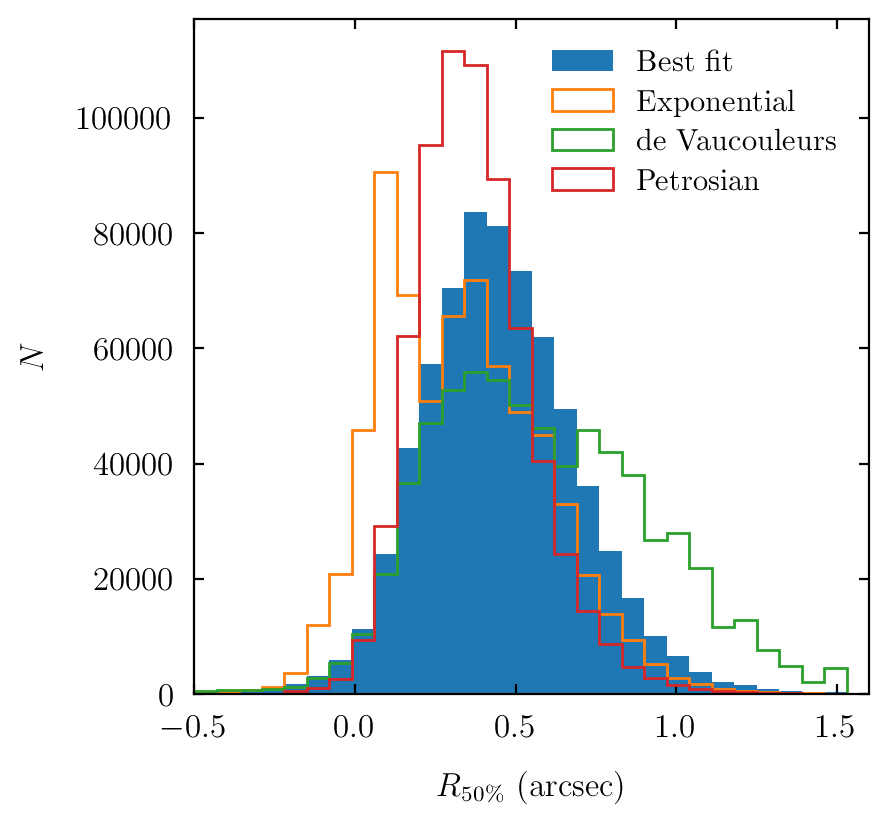

In [12]:
hist_args = dict(bins = 30, range = [-0.5, 1.6], histtype = 'step')
hist_args_best = hist_args.copy()
hist_args_best.update(histtype = 'stepfilled')

plt.figure()
plt.xlabel(r'$R_{50\%}\ ({\rm arcsec})$')
plt.ylabel(r'$N$')
plt.xlim(-0.5, 1.6)
plt.hist(np.log10(re_best), label = r'$\mathrm{Best\ fit}$', **hist_args_best)
plt.hist(np.log10(data['expRad_r']), label = r'$\mathrm{Exponential}$', **hist_args)
plt.hist(np.log10(data['deVRad_r']), label = r'$\mathrm{de\ Vaucouleurs}$', **hist_args)
plt.hist(np.log10(data['petroR50_r']), label = r'$\mathrm{Petrosian}$', **hist_args)
plt.legend()
plt.show()

As we noted before, a lot of these radii are dangerously close to the resolution limit given that one arcsecond corresponds to 2.5 pixels in SDSS. Either way, radii in arcsec don't tell us too much about the corresponding galaxies. Let's convert to kpc using the angular diameter distance:

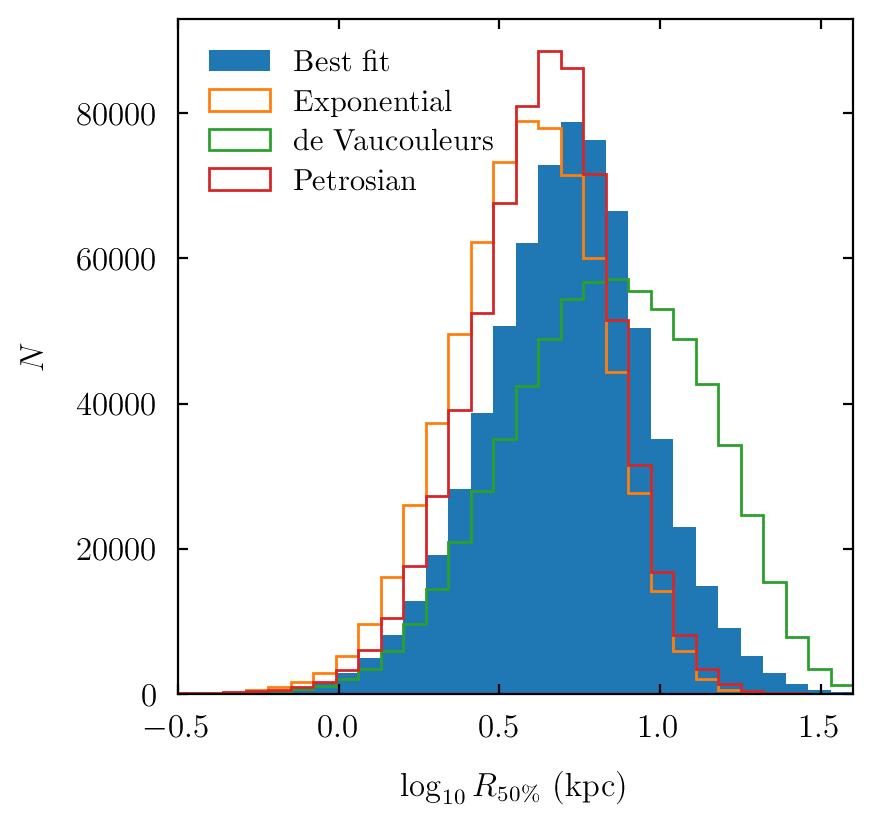

In [13]:
from colossus.cosmology import cosmology

cosmo = cosmology.getCurrent()
dA = cosmo.angularDiameterDistance(data['z']) / cosmo.h * 1000.0
kpc_factor = dA * np.pi / 180.0 / 3600.0
re_exp_kpc = data['expRad_r'] * kpc_factor
re_dev_kpc = data['deVRad_r'] * kpc_factor
re_best_kpc = re_best * kpc_factor
re_pet_kpc = data['petroR50_r'] * kpc_factor

plt.figure()
plt.xlabel(r'$\log_{10} R_{50\%}\ ({\rm kpc})$')
plt.ylabel(r'$N$')
plt.xlim(-0.5, 1.6)
plt.hist(np.log10(re_best_kpc), label = r'$\mathrm{Best\ fit}$', **hist_args_best)
plt.hist(np.log10(re_exp_kpc), label = r'$\mathrm{Exponential}$', **hist_args)
plt.hist(np.log10(re_dev_kpc), label = r'$\mathrm{de\ Vaucouleurs}$', **hist_args)
plt.hist(np.log10(re_pet_kpc), label = r'$\mathrm{Petrosian}$', **hist_args)
plt.legend()
plt.show()

Note how $1'' \approx 1\ {\rm kpc}$ for low redshifts (see figure in notebook 1) so that the numbers come out similar. The vast majority of galaxies have exponential $R_{\rm e}$ between 1 and 20 kpc. The physical $R_{\rm e}$ are also stored in ``data['Re_best_kpc']`` for convenience.

We would naively expect that more luminous galaxies are larger, but let's check that. We plot both the 2D distribution as well as the median size for all galaxies and those where the ``exp``/``deV`` profiles are preferred. The latter are a very crude stand-in for morphology, since we saw that exponential profiles often indicate disk-like galaxies. We will refine this methodology later.

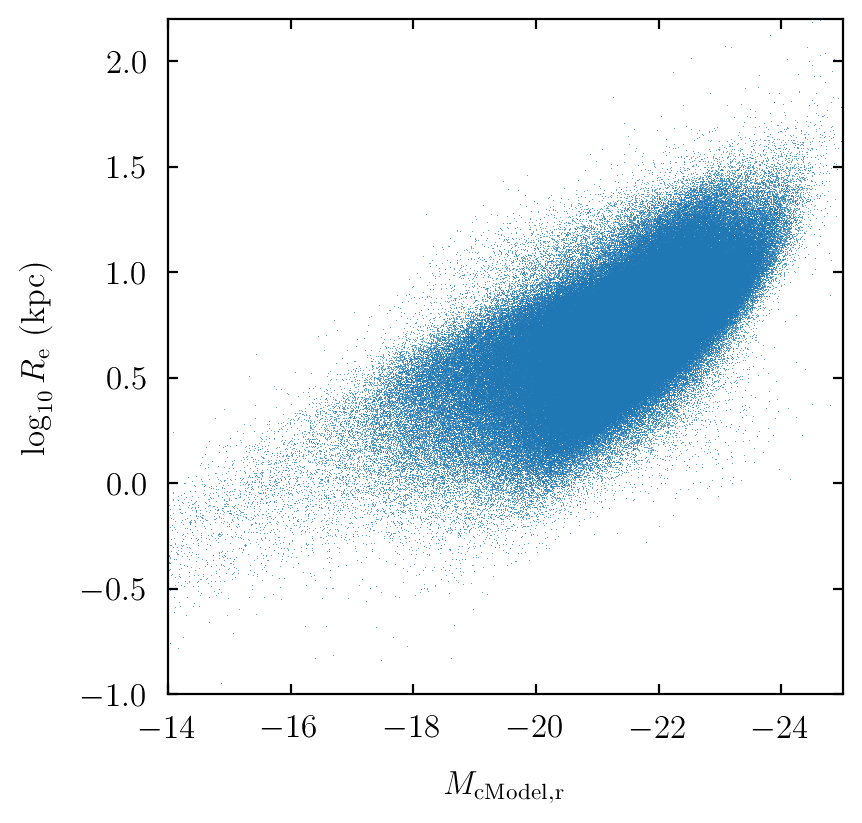

In [14]:
mag_lo = -14.0
mag_hi = -25.0
Re_lo = -1.0
Re_hi = 2.2

plt.figure()
plt.xlabel(r'$M_{\rm cModel,r}$')
plt.ylabel(r'$\log_{10} R_{\rm e}\ ({\rm kpc})$')
plt.scatter(data['M_cmodel_r'], np.log10(data['Re_best_kpc']), marker = '.', linewidths = 0, s = 0.3)
plt.xlim(mag_lo, mag_hi)
plt.ylim(Re_lo, Re_hi)
plt.show()

This plot isn't terribly useful because there are so many points that they overlap in regions of high density. In such cases, it's better to plot a 2D histogram. We also add the median radii.

Median size varies from 0.6 to 31 kpc.


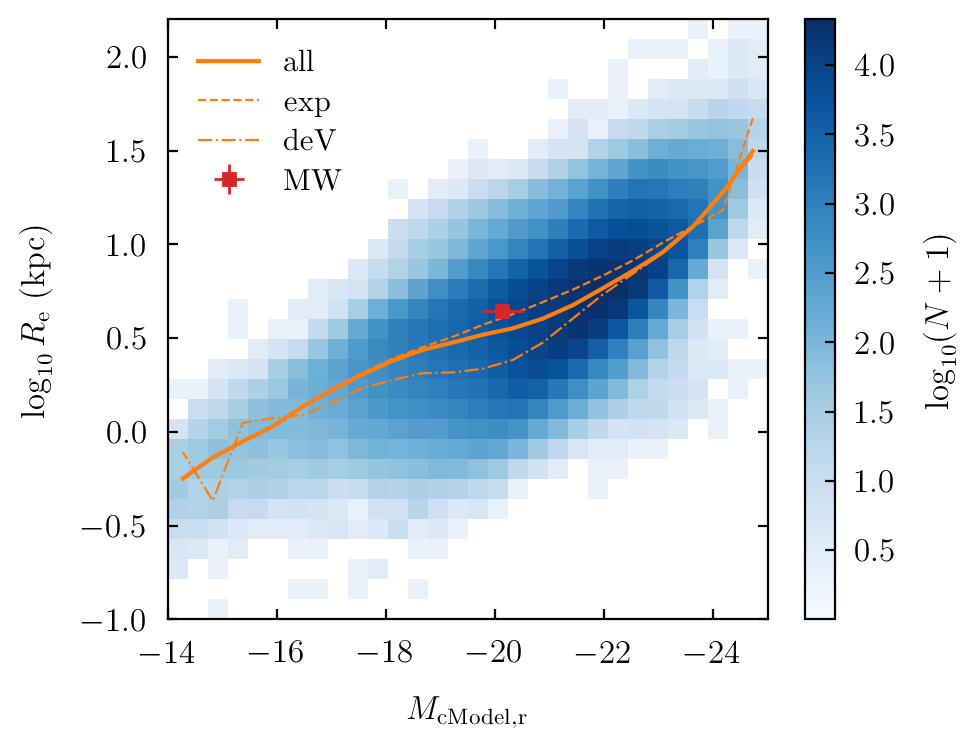

In [15]:
from routines import obs_utils

# Color map; for values below our minimum (zero galaxies), we set the colormap to white
cmap = plt.get_cmap('Blues')
cmap.set_under('#FFFFFF')

log_re = np.log10(data['Re_best_kpc'])
M = data['M_cmodel_r']
mask_exp = data['mask_exp']
mask_dev = np.logical_not(data['mask_exp'])

# Note the funny transpose and inversion of the first axis. This has to do with the different conventions
# in plt.imshow() and np.histogram2d(). 
hist, _, _ = np.histogram2d(M, log_re, bins = (30, 30), range = [[mag_hi, mag_lo], [Re_lo, Re_hi]])
hist = np.log10(hist.T[::-1] + 1.0)

# Compute medians for all galaxies and those where exp/deV is preferred (as a proxy for disk vs. elliptical)
med_args = dict(statistic = 'median', range = (mag_hi, mag_lo), bins = 20)
median_all, bin_edges, _ = scipy.stats.binned_statistic(M, log_re, **med_args)
median_exp, bin_edges, _ = scipy.stats.binned_statistic(M[mask_exp], log_re[mask_exp], **med_args)
median_dev, bin_edges, _ = scipy.stats.binned_statistic(M[mask_dev], log_re[mask_dev], **med_args)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) * 0.5

# Print extreme sizes at either end of the distribution
print('Median size varies from %.1f to %.0f kpc.' % (10**median_all[-1], 10**median_all[0]))

# We can simply invert the axes by setting changing the plot limits, whereas we 
# need to pass the correct limits to imshow (the same ones used to create the histogram)
plt.figure(figsize = (5.0, 4.0))
plt.xlabel(r'$M_{\rm cModel,r}$')
plt.ylabel(r'$\log_{10} R_{\rm e}\ ({\rm kpc})$')
plt.imshow(hist, extent = [mag_hi, mag_lo, Re_lo, Re_hi], interpolation = 'nearest', aspect = 'auto',
           cmap = cmap, vmin = 0.001, vmax = np.max(hist))
plt.plot(bin_centers, median_all, ls = '-', lw = 1.5, color = cmn.color_cycle[1], label = r'$\mathrm{all}$')
plt.plot(bin_centers, median_exp, ls = '--', lw = 0.8, color = cmn.color_cycle[1], label = r'$\mathrm{exp}$')
plt.plot(bin_centers, median_dev, ls = '-.', lw = 0.8, color = cmn.color_cycle[1], label = r'$\mathrm{deV}$')

# Plot MW
x_mw = [obs_utils.Mr_MW]
xerr_mw = [[obs_utils.Mr_MW - obs_utils.Mr_MW_lo], [obs_utils.Mr_MW_hi - obs_utils.Mr_MW]]
log_Re_MW = np.log10(obs_utils.Re_MW)
y_mw = [log_Re_MW]
yerr_mw = [[log_Re_MW - np.log10(obs_utils.Re_MW_lo)], [np.log10(obs_utils.Re_MW_hi) - log_Re_MW]]
plt.errorbar(x_mw, y_mw, xerr = xerr_mw, yerr = yerr_mw, fmt = 's', ms = 4.0, color = cmn.color_cycle[3], ecolor = cmn.color_cycle[3], 
             lw = 1.0, label = r'$\mathrm{MW}$')

plt.xlim(mag_lo, mag_hi)
plt.ylim(Re_lo, Re_hi)
plt.legend()
cbar = plt.colorbar()
cbar.set_label(r'$\log_{10} (N + 1)$')
plt.show()

Note that the most crowded cells contain almost 100,000 galaxies! That's not possible to see in a scatter plot.  As expected, more luminous galaxies are bigger in size, by a significant factor. The MW is quite typical in its size given its magnitude.

#### Low surface brightness (LSB) galaxies

In recent years, observations have pushed not only to galaxies that are overall fainter but also to lower surface brightness. The two are not necessarily the same, because a galaxy could in principle emit lots of light but over such a large area that a telescope that would pick it up if it were compact cannot distinguish it from the sky noise. Let's look at some LSB galaxies in SDSS:

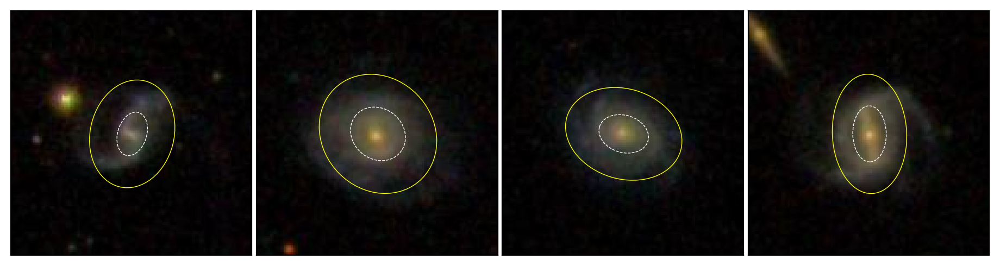

In [16]:
np.random.seed(2023)

# The factor of 2 comes from the fact that the half-light radius, by construction, contains
# half the total flux from the galaxy.
sb = data['m_petro_r'] + 2.5 * np.log10(2.0 * np.pi * data['Re_best']**2)

mask = (data['dL'] >= 100.0) & (data['dL'] <= 300.0)
mask &= (sb > 23.0)
mask &= (data['M_petro_r'] < -20.5)
mask &= (data['expAB_r'] > 0.5)

idxs_lsb = np.where(mask)[0]
idxs = idxs_lsb[np.random.randint(0, len(idxs_lsb) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_pix = 140, n_rows = n_rows, n_cols = n_cols)

These objects have large de Vaucouleur radii and indeed seem very diffuse. Interestingly, we get quite a different result when we define surface brightness using the radius that contains 50% of the Petrosian flux:

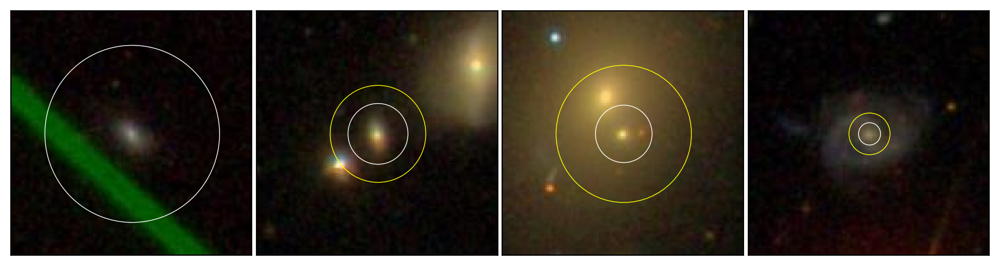

In [17]:
np.random.seed(2023)
sb = data['m_petro_r'] + 2.5 * np.log10(2.0 * np.pi * data['petroR50_r']**2)

mask = (data['dL'] >= 100.0) & (data['dL'] <= 300.0)
mask &= (sb > 22.5)
mask &= (data['M_petro_r'] < -20.5)
mask &= (data['expAB_r'] > 0.5)

idxs_lsb = np.where(mask)[0]
idxs = idxs_lsb[np.random.randint(0, len(idxs_lsb) - 1, n_rows * n_cols)]
plotImagesAndRe(data[idxs], n_pix = 140, n_rows = n_rows, n_cols = n_cols, radii = 'petro_50_90')

### 2.3.4) Magnitudes based on surface brightness profiles

We have now collected numerous definitions for magnitudes. Those computed form Sersic (exponential or de Vaucouleurs) profiles simply correspond to the total flux of the best-fit profile. We typically either pick the better fit (``model`` magnitude) or a linear superposition of the two fits (``cmodel`` magnitudes). All of these magnitudes are described in the SDSS [docs page on magnitudes](https://www.sdss3.org/dr8/algorithms/magnitudes.php). 

For Petrosian magnitudes, we integrate out to some particular multiple of the Petrosian radius (see lecture notes). Let's see if we can reproduce the SDSS results for the galaxies whose profiles we plotted above; we saved the profiles in an array.

Found R_P =  24.6, SDSS fit  23.9, ratio 1.03.
Found R_P =  42.3, SDSS fit  42.2, ratio 1.00.
Found R_P =  17.1, SDSS fit  17.5, ratio 0.98.
Found R_P =  13.6, SDSS fit  13.8, ratio 0.99.


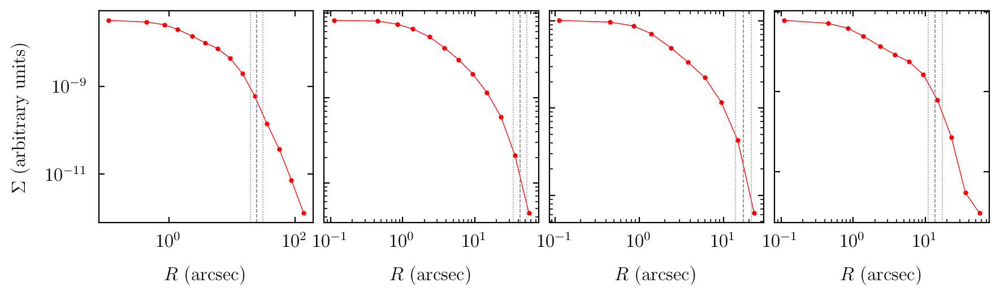

In [18]:
def sigmaIntegrand(R, interpolator):
    
    return R * 10**interpolator(np.log10(R))
    
def etaEquation(R, target, interpolator, log_R_min, log_R_max):
    
    R_lo = max(0.8 * R, R_min)
    R_hi = min(1.25 * R, R_max)
    I1, _ = scipy.integrate.quad(sigmaIntegrand, R_lo, R_hi, args = (interpolator,))
    I2, _ = scipy.integrate.quad(sigmaIntegrand, R_min, R, args = (interpolator,))
    eta = 1.0 / (1.25**2 - 0.8**2) * I1 / I2
    
    return eta - target

# The eta used for the Petrosian radius in SDSS
eta_sdss = 0.2

fig, axs = plt.subplots(1, n_cols, figsize = (0.5 + n_cols * 2.5, 2.5))
plt.subplots_adjust(wspace = 0.05)
for i in range(n_cols):
    plt.sca(axs[i])
    plt.loglog()
    plt.xlabel(r'$R\ ({\rm arcsec})$')
    if i == 0:
        plt.ylabel(r'$\Sigma\ (\mathrm{arbitrary\ units})$', labelpad = 10)
    else:
        axs[i].set_yticklabels([])

    # Plot profile
    R = prfs_r[0][i][0]
    mu = prfs_r[0][i][1]
    Sigma = 10**(-0.4 * mu)
    plt.plot(R, Sigma, marker = 'o', ms = 2.0, lw = 0.5, c = obs_sdss.filter_colors[2])

    # Find petrosian radius (in log space)
    R_min = R[0] * 1.001
    R_max = R[-1] * 0.999
    interpolator = scipy.interpolate.interp1d(np.log10(R), np.log10(Sigma))
    R_P = scipy.optimize.brentq(etaEquation, R_min * 1.001, R_max, args = (eta_sdss, interpolator, R_min, R_max))

    # Print and plot results
    R_P_cat = data[idxs_gals[0][i]]['petroRad_r']
    print('Found R_P = %5.1f, SDSS fit %5.1f, ratio %.2f.' % (R_P, R_P_cat, R_P / R_P_cat))
    plt.axvline(R_P, ls = '--', color = 'gray', lw = 0.6)
    plt.axvline(R_P * 0.8, ls = ':', color = 'gray', lw = 0.6)
    plt.axvline(R_P * 1.25, ls = ':', color = 'gray', lw = 0.6)

plt.show()

This works impressively well! Clearly, the SDSS pipeline does something very similar to our algorithm.

Let's now plot the linear superposition factor between exponential and de Vaucouleurs in our SDSS data:

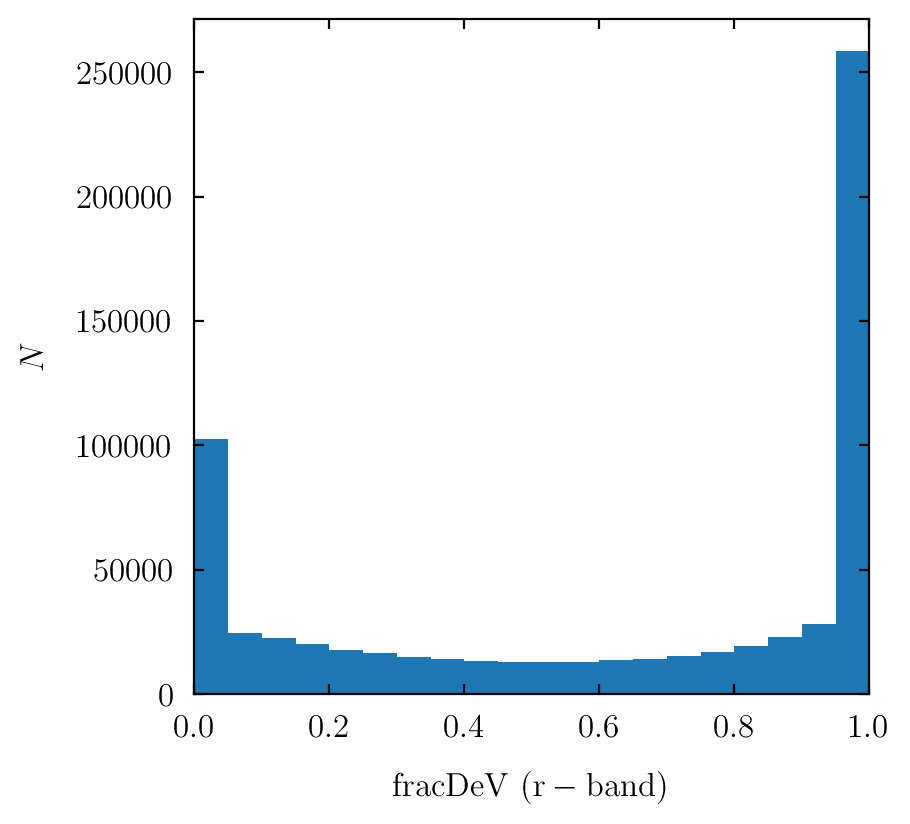

In [19]:
plt.figure()
plt.xlabel(r'$\mathrm{fracDeV\ (r-band)}$')
plt.ylabel(r'$N$')
plt.xlim(0.0, 1.0)
plt.hist(data['fracdeV_r'], bins = 20, range = [0.0, 1.0])
plt.show()

Clearly, the algorithm tends to choose either the exponential of de Vaucouleurs fit for the majority of galaxies. For those galaxies, the ``cmodel`` magnitudes are identical to either the ``exp`` or ``deV`` ones (similar to the ``model`` magnitudes). Let's now compare magnitudes directly, for example the ``cmodel`` and ``petro`` magnitudes:

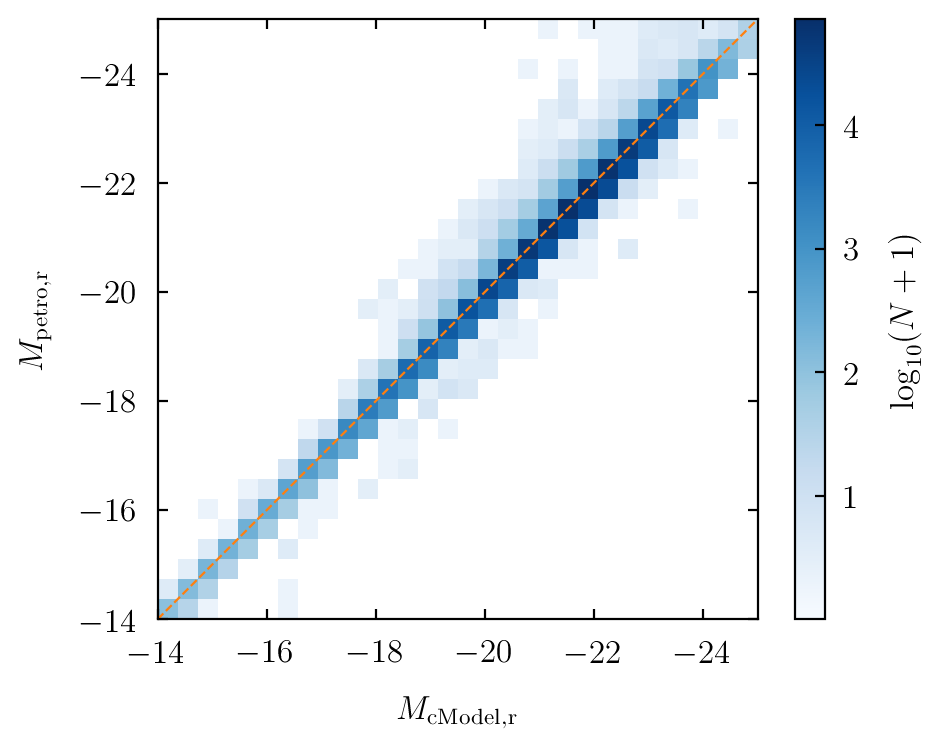

In [20]:
hist, _, _ = np.histogram2d(data['M_cmodel_r'], data['M_petro_r'], 
                            bins = (30, 30), range = [[mag_hi, mag_lo], [mag_hi, mag_lo]])
hist = np.log10(hist.T[::-1] + 1.0)

plt.figure(figsize = (5.0, 4.0))
plt.xlabel(r'$M_{\rm cModel,r}$')
plt.ylabel(r'$M_{\rm petro,r}$')
plt.imshow(hist, extent = [mag_hi, mag_lo, mag_hi, mag_lo], interpolation = 'nearest', aspect = 'auto',
           cmap = cmap, vmin = 0.001, vmax = np.max(hist))
plt.plot([mag_lo, mag_hi], [mag_lo, mag_hi], '--', color = cmn.color_cycle[1], lw = 0.8)
plt.xlim(mag_lo, mag_hi)
plt.ylim(mag_lo, mag_hi)
cbar = plt.colorbar()
cbar.set_label(r'$\log_{10} (N + 1)$')
plt.show()

In general, the ``cmodel`` and ``petro`` magnitudes seem to agree pretty well. On the other hand, we have a range of 10 magnitudes on the $y$-axis, so it might be better to plot the difference:

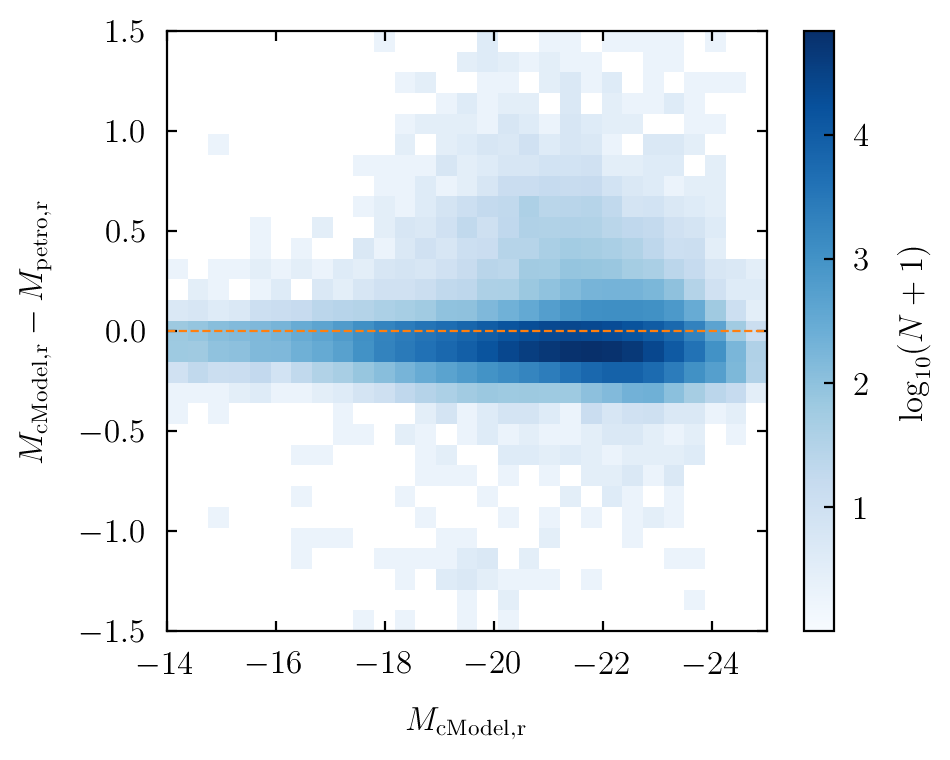

Median difference is -0.08 +- 0.10 magnitudes.


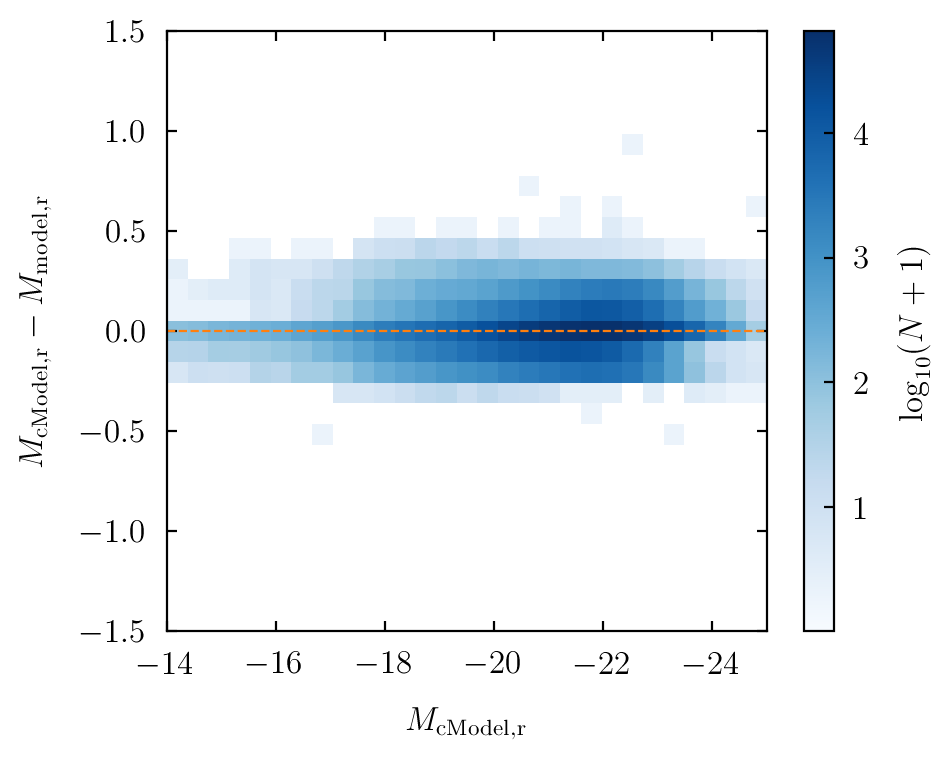

Median difference is 0.00 +- 0.11 magnitudes.


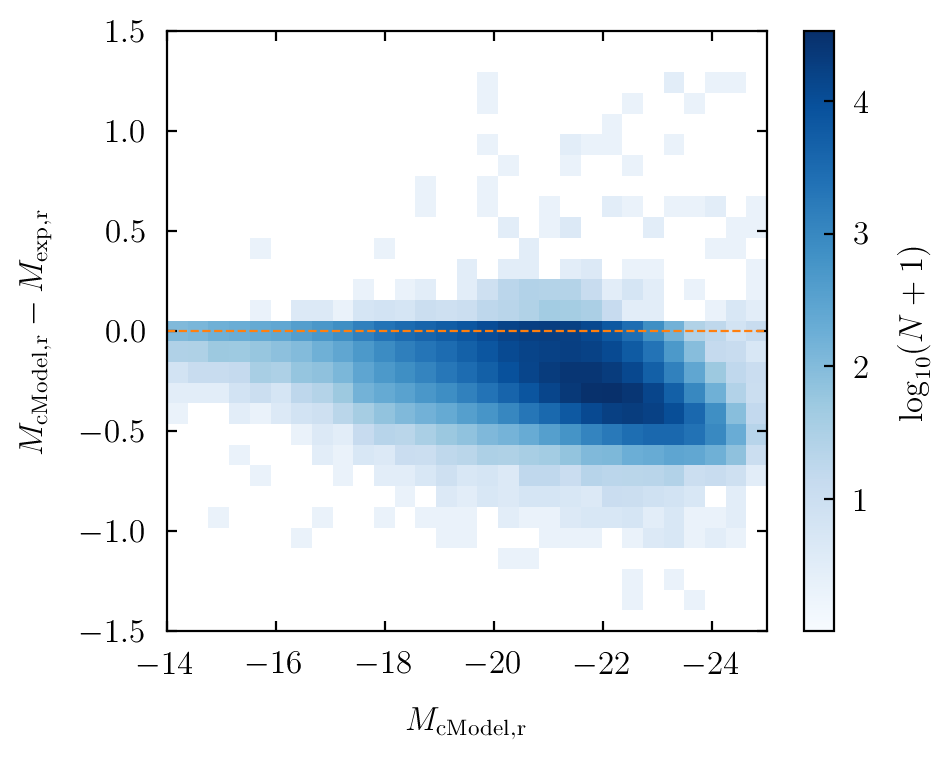

Median difference is -0.22 +- 0.34 magnitudes.


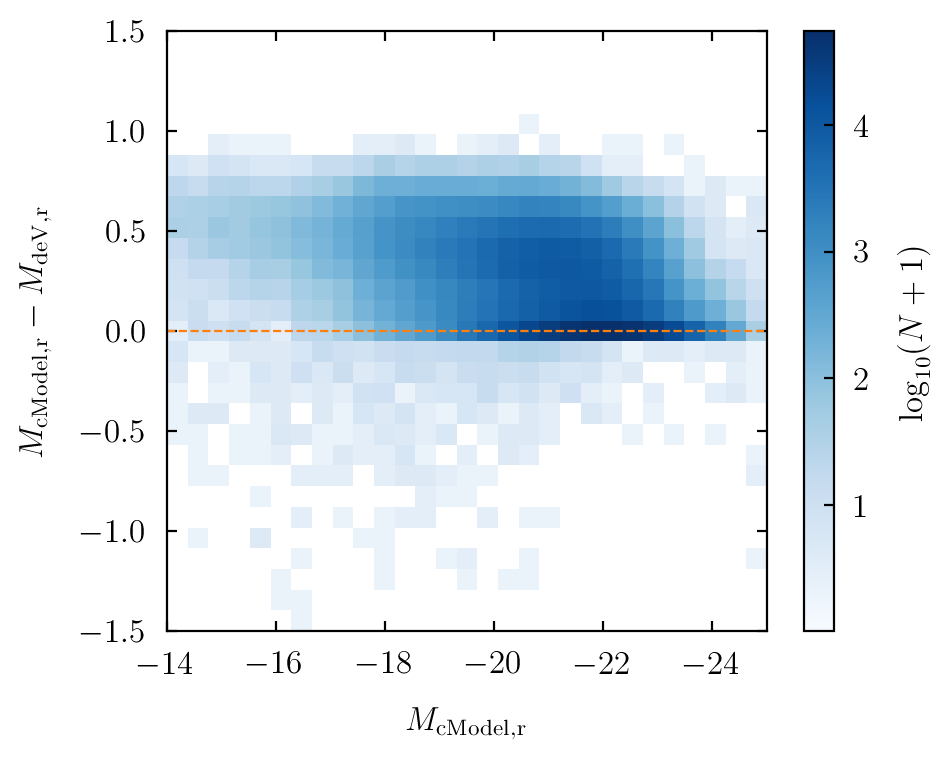

Median difference is 0.06 +- 0.38 magnitudes.


In [21]:
def compareMagnitudes(def1, def2, label1, label2, diff_ext = 1.5, n_bins = 29):

    hist, _, _ = np.histogram2d(data[def1], data[def1] - data[def2], 
                                bins = (n_bins, n_bins), range = [[mag_hi, mag_lo], [-diff_ext, diff_ext]])
    hist = np.log10(hist.T[::-1] + 1.0)

    plt.figure(figsize = (5.0, 4.0))
    plt.xlabel(r'$%s$' % label1)
    plt.ylabel(r'$%s - %s$' % (label1, label2))
    plt.imshow(hist, extent = [mag_hi, mag_lo, -diff_ext, diff_ext], interpolation = 'nearest', aspect = 'auto',
               cmap = cmap, vmin = 0.001, vmax = np.max(hist))
    plt.axhline(0.0, ls = '--', color = cmn.color_cycle[1], lw = 0.8)
    plt.xlim(mag_lo, mag_hi)
    plt.ylim(-diff_ext, diff_ext)
    cbar = plt.colorbar()
    cbar.set_label(r'$\log_{10} (N + 1)$')
    plt.show()
    
    mask = (data[def1] >= mag_hi) & (data[def1] <= mag_lo)
    diff = data[def1][mask] - data[def2][mask]
    diff_med = np.median(diff)
    diff_lo = np.percentile(diff, 16.0)
    diff_hi = np.percentile(diff, 84.0)
    print('Median difference is %.2f +- %.2f magnitudes.' % (diff_med, diff_hi - diff_lo))
    
    return

compareMagnitudes('M_cmodel_r', 'M_petro_r', r'M_{\rm cModel,r}', r'M_{\rm petro,r}')
compareMagnitudes('M_cmodel_r', 'M_model_r', r'M_{\rm cModel,r}', r'M_{\rm model,r}')
compareMagnitudes('M_cmodel_r', 'M_exp_r', r'M_{\rm cModel,r}', r'M_{\rm exp,r}')
compareMagnitudes('M_cmodel_r', 'M_deV_r', r'M_{\rm cModel,r}', r'M_{\rm deV,r}')

As expected from our plot of ``fracDeV`` above, there are quite a few galaxies for which the ``cModel`` and ``exp``/``deV`` magnitudes are identical. For those where they are not, the ``exp`` magnitudes tend to be larger (lower flux) and the ``deV`` magnitudes smaller (higher flux), which is not surprising given our plots above.